In [1]:
import pandas as pd


In [2]:
intersection_d =pd.read_csv("tmc_cleaned.csv")
signal = pd.read_csv("Traffic Signal - 4326.csv")

In [3]:
import ast

signal["geometry"] = signal["geometry"].apply(ast.literal_eval)

In [4]:
signal["longitude"] = signal["geometry"].apply(lambda x: x["coordinates"][0][0])
signal["latitude"] = signal["geometry"].apply(lambda x: x["coordinates"][0][1])

In [5]:
intersection_d["longitude_round"] = intersection_d["longitude"].round(4)
intersection_d["latitude_round"] = intersection_d["latitude"].round(4)

signal["longitude_round"] = signal["longitude"].round(4)
signal["latitude_round"] = signal["latitude"].round(4)

In [6]:
merged = intersection_d.merge(
    signal,
    on=["longitude_round", "latitude_round"],
    how="inner",
    indicator=True
)

In [7]:
#testing out how many different streets there is in each dataset
intersection_d[["longitude", "latitude"]].drop_duplicates().shape[0]
signal[["longitude", "latitude"]].drop_duplicates().shape[0]

2543

In [ ]:
#visualize how signal locations can be slightly misaligned
import geopandas as gpd
import matplotlib.pyplot as plt

# Unique locations only
traffic_points = intersection_d[
    ["longitude", "latitude"]
].drop_duplicates()

signal_points = signal[
    ["longitude", "latitude"]
].drop_duplicates()

# Convert to GeoDataFrames
traffic_geo = gpd.GeoDataFrame(
    traffic_points,
    geometry=gpd.points_from_xy(
        traffic_points["longitude"],
        traffic_points["latitude"]
    ),
    crs="EPSG:4326"
)

signal_geo = gpd.GeoDataFrame(
    signal_points,
    geometry=gpd.points_from_xy(
        signal_points["longitude"],
        signal_points["latitude"]
    ),
    crs="EPSG:4326"
)

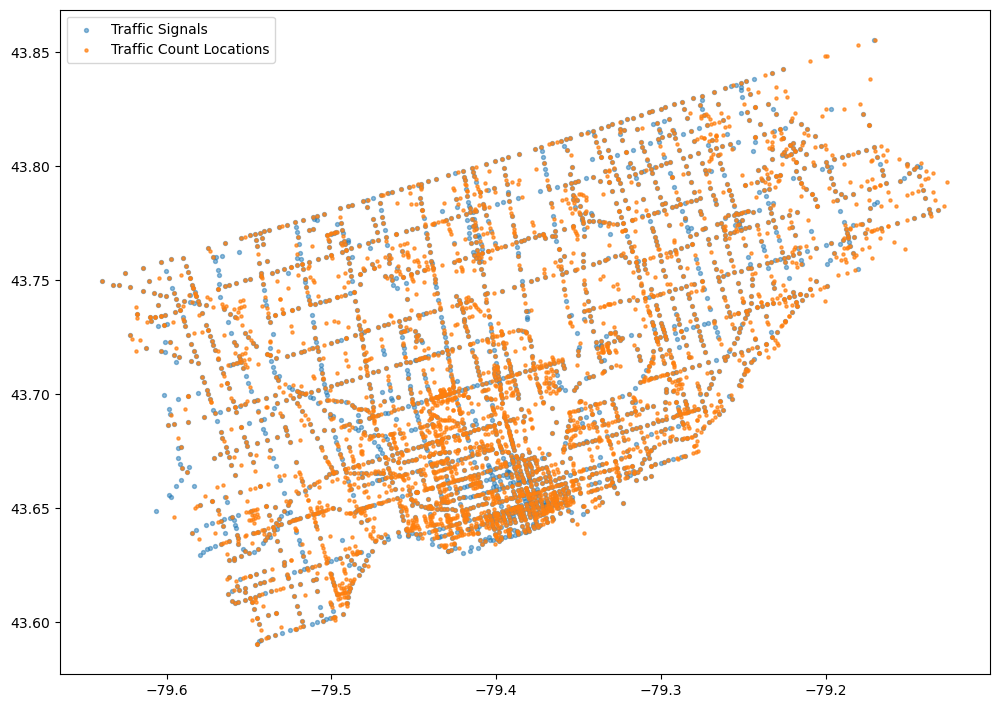

In [9]:
fig, ax = plt.subplots(figsize=(12, 12))

signal_geo.plot(
    ax=ax,
    markersize=8,
    alpha=0.5,
    label="Traffic Signals"
)

traffic_geo.plot(
    ax=ax,
    markersize=5,
    alpha=0.7,
    label="Traffic Count Locations"
)

plt.legend()
plt.show()

In [10]:
#now that we merged the data and have the merged data, it is time to see what we need to determine vehicles and passersby moving from different streets
#find intersection N/S E/W

#merge centreline data with unique traffic data
cline =pd.read_csv("Centreline.csv", usecols=["LINEAR_NAME_FULL","geometry"])
cline["LINEAR_NAME_FULL"] = cline["LINEAR_NAME_FULL"].str.upper()

In [11]:
# Start clean column as an exact copy
cline["LINEAR_NAME_CLEAN"] = cline["LINEAR_NAME_FULL"].copy()

# Only identify Centreline names that don't already match signal
mask = ~cline["LINEAR_NAME_FULL"].isin(signal["SIDE1_STREET"])

# Strip N/S/E/W only for those unmatched names
cline.loc[mask, "LINEAR_NAME_CLEAN"] = (
    cline.loc[mask, "LINEAR_NAME_FULL"]
    .str.replace(r"\s+[NSEW]$", "", regex=True)
)

In [12]:
#seeing issue with unmatched data
signal["SIDE1_STREET"].isin(cline["LINEAR_NAME_CLEAN"]).value_counts()

SIDE1_STREET
True     2467
False      76
Name: count, dtype: int64

In [13]:
#too much manual process, we let it go
signal.loc[
    ~signal["SIDE1_STREET"].isin(cline["LINEAR_NAME_CLEAN"]),
    "SIDE1_STREET"
].value_counts()

SIDE1_STREET
PRIVATE ACCESS          4
QUEENS PLATE DR         3
MC CAUL ST              3
FRONT ST                2
ST JOHNS RD             2
                       ..
NORTHAMBERLAND ST       1
QUEENS PARK             1
WAGGONERS WELLS LN      1
HWY 401 C W OFF RAMP    1
VILLIERS PARK           1
Name: count, Length: 64, dtype: int64

In [ ]:
#merge city centreline data with intersection signal data
merged_1 = signal.merge(
    cline,
    left_on="SIDE1_STREET",
    right_on="LINEAR_NAME_CLEAN",
    how="inner"
)

In [ ]:
#there was 76 missing geometry, we drop them
merged_1 = merged_1.dropna(subset=["geometry_y"]).copy()

In [18]:
merged_1["geometry_y"] = merged_1["geometry_y"].apply(ast.literal_eval)
merged_1["cline_coords"] = merged_1["geometry_y"].apply(
    lambda x: x["coordinates"][0]
)

In [ ]:
#each side steet has a few slightly different coordinates, we use the first entry as reference
cline[
    cline["LINEAR_NAME_CLEAN"] == "LOWER JARVIS ST"
][["LINEAR_NAME_CLEAN", "geometry"]]

,LINEAR_NAME_CLEAN,geometry
184,LOWER JARVIS ST,"{""coordinates"": [[[-79.3700018685412, 43.64597..."
15057,LOWER JARVIS ST,"{""coordinates"": [[[-79.3709074020546, 43.64819..."
19583,LOWER JARVIS ST,"{""coordinates"": [[[-79.3698236395743, 43.64554..."
42534,LOWER JARVIS ST,"{""coordinates"": [[[-79.3701935286276, 43.64643..."
50908,LOWER JARVIS ST,"{""coordinates"": [[[-79.37077968107, 43.6478361..."
53561,LOWER JARVIS ST,"{""coordinates"": [[[-79.3698554090462, 43.64563..."
54081,LOWER JARVIS ST,"{""coordinates"": [[[-79.3699391948584, 43.64584..."
54134,LOWER JARVIS ST,"{""coordinates"": [[[-79.3698909717287, 43.64572..."
58510,LOWER JARVIS ST,"{""coordinates"": [[[-79.3689620741502, 43.64392..."


In [22]:
merged_1 = merged_1.drop_duplicates(
    subset="LINEAR_NAME_CLEAN",
    keep="first"
)

In [ ]:
#use geometric orientation procedure to to determine side street direction
import numpy as np
def point_to_segment_distance(px, py, x1, y1, x2, y2):
    
    # Convert longitude difference to roughly comparable distance
    cos_lat = np.cos(np.radians(py))
    
    px2 = px * cos_lat
    x1_2 = x1 * cos_lat
    x2_2 = x2 * cos_lat
    
    dx = x2_2 - x1_2
    dy = y2 - y1
    
    if dx == 0 and dy == 0:
        return np.sqrt((px2 - x1_2)**2 + (py - y1)**2)

    t = (
        (px2 - x1_2) * dx +
        (py - y1) * dy
    ) / (dx**2 + dy**2)

    # we require the closest point to be on the segment
    t = max(0, min(1, t))

    closest_x = x1_2 + t * dx
    closest_y = y1 + t * dy

    return np.sqrt(
        (px2 - closest_x)**2 +
        (py - closest_y)**2
    )

In [25]:
def closest_segment(intersection_geom, line_geom):

    # Get intersection lon / lat
    intersection_point = intersection_geom["coordinates"][0]

    px = intersection_point[0]
    py = intersection_point[1]

    best_segment = None
    best_distance = float("inf")

    for i in range(len(line_geom) - 1):

            p1 = line_geom[i]
            p2 = line_geom[i + 1]

            distance = point_to_segment_distance(
                px,
                py,
                p1[0],
                p1[1],
                p2[0],
                p2[1]
            )

            if distance < best_distance:
                best_distance = distance
                best_segment = (p1, p2)

    return best_segment

In [26]:
def get_orientation(intersection_geom, line_geom):

    p1, p2 = closest_segment(
        intersection_geom,
        line_geom
    )

    intersection_lat = intersection_geom["coordinates"][0][1]

    lon_diff = abs(p2[0] - p1[0]) * np.cos(
        np.radians(intersection_lat)
    )

    lat_diff = abs(p2[1] - p1[1])

    if lon_diff > lat_diff:
        return "EW"
    else:
        return "NS"

In [ ]:
merged_1["SIDE_STREET_ORIENTATION"] = merged_1.apply(
    lambda row: get_orientation(
        row["geometry_x"],   # intersection geometry
        row["cline_coords"]    # side-street MultiLineString
    ),
    axis=1
)

In [32]:
merged_1[
    ["MAIN_STREET", "SIDE1_STREET", "SIDE_STREET_ORIENTATION"]
].sample(30, random_state=42)

,MAIN_STREET,SIDE1_STREET,SIDE_STREET_ORIENTATION
54690,PORT UNION RD,CONFERENCE BLVD,EW
40619,HARBORD ST,HURON ST,NS
33462,SCARLETT RD,EDENBRIDGE DR,EW
32917,BROWNS LINE,VALERMO DR,EW
35535,SHEPPARD AVE E,ALLANFORD RD,NS
39054,DON MILLS RD,MALLARD RD,EW
63207,PAPE AVE,LIPTON AVE,EW
61441,RANEE AVE,FLEMINGTON RD,EW
61869,FORT YORK BLVD,GZOWSKI BLVD,NS
21302,TRETHEWEY DR,YORE RD,EW


In [ ]:
#now we merge orientation/signal data with intersection vehicle/pedestrian observation
finale = intersection_d.merge(
    merged_1,
    on=["longitude_round", "latitude_round"],
    how="inner",
    indicator=True
)

In [ ]:
#aggregate all kinds of vehicle types into one 
directions = ["n", "s", "e", "w"]
vehicle_types = ["cars", "truck", "bus"]
movements = ["r", "t", "l"]

for d in directions:
    cols = [
        f"{d}_appr_{v}_{m}"
        for v in vehicle_types
        for m in movements
    ]

    finale[f"{d}_vehicles"] = finale[cols].sum(axis=1)

In [37]:
keep_cols = [
    "count_date",
    "location_name",
    "start_time_day",
    "end_time_day",

    "MAIN_STREET",
    "SIDE1_STREET",

    # Cars
    "n_vehicles",
    "s_vehicles",
    "e_vehicles",
    "w_vehicles",

    # Pedestrians
    "n_appr_peds",
    "s_appr_peds",
    "e_appr_peds",
    "w_appr_peds",

    # Spatial / orientation
    "CONTROL_MODE",
    "geometry_x",
    "cline_coords",
    "SIDE_STREET_ORIENTATION"
]

analysis_df = finale[keep_cols].copy()

In [ ]:
#some side street orientation seems to be wrong, let us try to see if this is the issue across the board
check_streets = []

for location in analysis_df["location_name"].unique():
    temp = analysis_df[
        analysis_df["location_name"] == location
    ]
    ns_total = temp["n_vehicles"].sum() + temp["s_vehicles"].sum()

    ew_total = temp["e_vehicles"].sum() + temp["w_vehicles"].sum()

    side_orientation = temp["SIDE_STREET_ORIENTATION"].iloc[0]
    
    side_street = temp["SIDE1_STREET"].iloc[0]

    if ns_total > ew_total and side_orientation == "NS":
          check_streets.append([
              location,
              side_street,
              side_orientation,
              ns_total,
              ew_total])
    if ew_total > ns_total and side_orientation == "EW":
        check_streets.append([
                      location,
                      side_street,
                      side_orientation,
                      ns_total,
                      ew_total])



In [41]:
check_df = pd.DataFrame(
    check_streets,
    columns=[
        "location",
        "side_street",
        "side_orientation",
        "ns_total",
        "ew_total"
    ]
)

In [42]:
pd.set_option("display.max_rows", None)
check_df

,location,side_street,side_orientation,ns_total,ew_total
0,Paulson Rd / Trethewey Dr,PAULSON RD,EW,108,15503
1,Danforth Ave / Donlands Ave,DONLANDS AVE,EW,24555,83748
2,Danforth Ave / Main St,DANFORTH AVE,EW,54391,107289
3,Tapscott Rd / Blackwell Ave,BLACKWELL AVE,EW,3387,15141
4,Parkside Dr / Howard Park Ave,HOWARD PARK AVE,NS,111476,11466
5,Lawrence Ave E / Railside Rd / Curlew Dr,CURLEW DR,EW,6480,43014
6,Lake Shore Blvd W / Legion Rd,LEGION RD,EW,494,8967
7,Brimley Rd / Chillery Ave,CHILLERY AVE,NS,61277,2108
8,Roncesvalles Ave / Dundas St W,RONCESVALLES AVE,NS,69532,28628
9,Lawrence Ave E / Mount Pleasant Rd,LAWRENCE AVE E,EW,21124,61246


In [43]:
#safely back up
analysis_df_backup =analysis_df.copy()

In [ ]:
#we fix the streets with wrong orientation
for i in check_df["location"]:

    mask = analysis_df["location_name"] == i

    orientation = analysis_df.loc[
        mask, "SIDE_STREET_ORIENTATION"
    ].iloc[0]

    if orientation == "NS":

        analysis_df.loc[
            mask, "SIDE_STREET_ORIENTATION"
        ] = "EW"

    else:

        analysis_df.loc[
            mask, "SIDE_STREET_ORIENTATION"
        ] = "NS"


In [ ]:
#now we do a prototypoe run through to see what we can get, we should go as deep as possible so that the work can be mapped out and replicated throughout the entire set
alpha_test = analysis_df[analysis_df["location_name"] == "Paulson Rd / Trethewey Dr"].copy()

alpha_test["main_vehicle"] = (
    alpha_test["e_vehicles"] +
    alpha_test["w_vehicles"]
)
alpha_test["side_vehicle"] = (
    alpha_test["n_vehicles"] +
    alpha_test["s_vehicles"]
)
alpha_test["main_pedestrian"] = (
    alpha_test["e_appr_peds"] +
    alpha_test["w_appr_peds"]
)
alpha_test["side_pedestrian"] = (
    alpha_test["n_appr_peds"] +
    alpha_test["s_appr_peds"]
)
time_group = (
    alpha_test
    .groupby("start_time_day")[["main_vehicle", "side_vehicle"]]
    .mean()
    .reset_index()
)

,count_date,location_name,start_time_day,end_time_day,MAIN_STREET,SIDE1_STREET,n_vehicles,s_vehicles,e_vehicles,w_vehicles,n_appr_peds,s_appr_peds,e_appr_peds,w_appr_peds,CONTROL_MODE,geometry_x,cline_coords,SIDE_STREET_ORIENTATION
0,2020-02-06,Paulson Rd / Trethewey Dr,07:30:00,07:45:00,TRETHEWEY DR,PAULSON RD,1,0,82,186,2,0,0,1,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
1,2020-02-06,Paulson Rd / Trethewey Dr,07:45:00,08:00:00,TRETHEWEY DR,PAULSON RD,2,0,94,176,1,0,0,0,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
2,2020-02-06,Paulson Rd / Trethewey Dr,08:00:00,08:15:00,TRETHEWEY DR,PAULSON RD,2,0,79,215,0,0,0,1,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
3,2020-02-06,Paulson Rd / Trethewey Dr,08:15:00,08:30:00,TRETHEWEY DR,PAULSON RD,3,0,81,212,3,0,0,0,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
4,2020-02-06,Paulson Rd / Trethewey Dr,08:30:00,08:45:00,TRETHEWEY DR,PAULSON RD,1,0,92,196,3,0,2,2,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
5,2020-02-06,Paulson Rd / Trethewey Dr,08:45:00,09:00:00,TRETHEWEY DR,PAULSON RD,3,0,91,240,3,0,0,1,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
6,2020-02-06,Paulson Rd / Trethewey Dr,09:00:00,09:15:00,TRETHEWEY DR,PAULSON RD,1,0,77,182,4,0,0,3,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
7,2020-02-06,Paulson Rd / Trethewey Dr,09:15:00,09:30:00,TRETHEWEY DR,PAULSON RD,3,0,69,164,0,0,0,0,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
8,2020-02-06,Paulson Rd / Trethewey Dr,10:00:00,10:15:00,TRETHEWEY DR,PAULSON RD,2,0,70,153,2,0,2,0,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS
9,2020-02-06,Paulson Rd / Trethewey Dr,10:15:00,10:30:00,TRETHEWEY DR,PAULSON RD,5,0,69,122,0,0,0,0,SA2,"{'coordinates': [[-79.4822456119457, 43.693707...","[[-79.4787934393504, 43.6945251548937], [-79.4...",NS


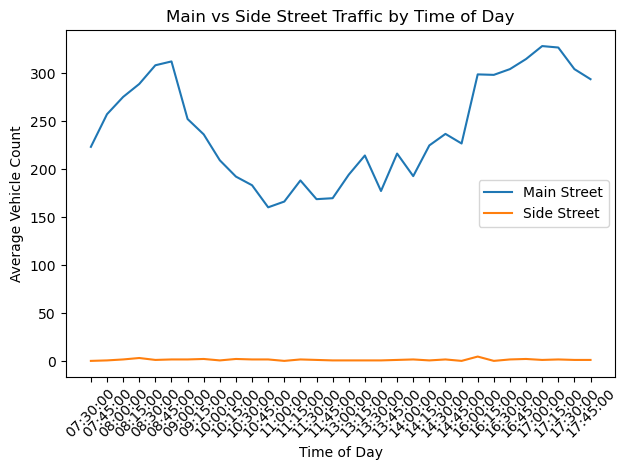

In [49]:
plt.plot(
    time_group["start_time_day"],
    time_group["main_vehicle"],
    label="Main Street"
)

plt.plot(
    time_group["start_time_day"],
    time_group["side_vehicle"],
    label="Side Street"
)

plt.xlabel("Time of Day")
plt.ylabel("Average Vehicle Count")
plt.title("Main vs Side Street Traffic by Time of Day")

plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()

plt.show()

In [ ]:
#based on our single run, we run this for the entire dataset
ns_mask = analysis_df["SIDE_STREET_ORIENTATION"] == "NS"
ew_mask = analysis_df["SIDE_STREET_ORIENTATION"] == "EW"

analysis_df.loc[ns_mask, "main_vehicle"] = (
    analysis_df.loc[ns_mask, "e_vehicles"] +
    analysis_df.loc[ns_mask, "w_vehicles"]
)

analysis_df.loc[ns_mask, "side_vehicle"] = (
    analysis_df.loc[ns_mask, "n_vehicles"] +
    analysis_df.loc[ns_mask, "s_vehicles"]
)

analysis_df.loc[ew_mask, "main_vehicle"] = (
    analysis_df.loc[ew_mask, "n_vehicles"] +
    analysis_df.loc[ew_mask, "s_vehicles"]
)

analysis_df.loc[ew_mask, "side_vehicle"] = (
    analysis_df.loc[ew_mask, "e_vehicles"] +
    analysis_df.loc[ew_mask, "w_vehicles"]
)

analysis_df.loc[ns_mask, "main_pedestrian"] = (
    analysis_df.loc[ns_mask, "e_appr_peds"] +
    analysis_df.loc[ns_mask, "w_appr_peds"]
)

analysis_df.loc[ns_mask, "side_pedestrian"] = (
    analysis_df.loc[ns_mask, "n_appr_peds"] +
    analysis_df.loc[ns_mask, "s_appr_peds"]
)

analysis_df.loc[ew_mask, "main_pedestrian"] = (
    analysis_df.loc[ew_mask, "n_appr_peds"] +
    analysis_df.loc[ew_mask, "s_appr_peds"]
)

analysis_df.loc[ew_mask, "side_pedestrian"] = (
    analysis_df.loc[ew_mask, "e_appr_peds"] +
    analysis_df.loc[ew_mask, "w_appr_peds"]
)

In [51]:
ultimate_time_group = (
    analysis_df
    .groupby(["location_name", "start_time_day"])[
        ["main_vehicle", "side_vehicle", "main_pedestrian", "side_pedestrian"]
    ]
    .mean()
    .reset_index()
)


In [52]:
#adding persistence
ultimate_time_group["dominant"] = (
    ultimate_time_group["main_vehicle"] >=
    1.5 * ultimate_time_group["side_vehicle"]
)
persistence = (
    ultimate_time_group
    .groupby("location_name")["dominant"]
    .mean()
)

In [53]:
#adding side vehicle/pedestrain correlation
overlap = (
    ultimate_time_group
    .groupby("location_name")
    .apply(
        lambda x: x["side_vehicle"].corr(
            x["side_pedestrian"]
        )
    )
    .reset_index(name="vehicle_ped_overlap")
)

/Users/Emmett/.julia/conda/3/x86_64/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2999: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/Emmett/.julia/conda/3/x86_64/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3000: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/var/folders/06/z7ly22pn2_3093y1xckgjsqm0000gn/T/ipykernel_61327/1923306732.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(


In [54]:
#add main/side correlation for vehicle
main_side_corr = (
    ultimate_time_group
    .groupby("location_name")
    .apply(
        lambda x: x["main_vehicle"].corr(
            x["side_vehicle"]
        )
    )
    .reset_index(name="main_side_temporal_corr")
)

/Users/Emmett/.julia/conda/3/x86_64/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2999: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/Emmett/.julia/conda/3/x86_64/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3000: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/var/folders/06/z7ly22pn2_3093y1xckgjsqm0000gn/T/ipykernel_61327/2827154343.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(


In [ ]:
#Adding our dominance factor k
ultimate_time_group["k"] = (
    (ultimate_time_group["main_vehicle"] - ultimate_time_group["side_vehicle"]) /
    (ultimate_time_group["main_vehicle"] + ultimate_time_group["side_vehicle"])
)

In [56]:
street_k = (
    ultimate_time_group
    .groupby("location_name")["k"]
    .mean()
    .reset_index()
)
street_k = street_k.rename(columns={"k": "K"})

In [ ]:
#because we use location_name which is not in traffic signal(uses main street, side street, intersection coordinates), we take analysis_df to drop duplicates and merge
analysis_compressed = analysis_df.drop_duplicates(
    subset="location_name",
    keep="first"
).copy()


In [59]:
signal_k = analysis_compressed.merge(
    street_k,
    on="location_name",
    how="inner"
)
signal_k = signal_k.merge(
    persistence,
    on="location_name",
    how="inner"
)

signal_k = signal_k.merge(
    overlap,
    on="location_name",
    how="inner"
)
signal_k = signal_k.merge(
    main_side_corr,
    on="location_name",
    how="inner"
)

In [ ]:
#calculate percentile for each metrics in case they come in handy
metrics = [
    "K",
    "dominant",
    "vehicle_ped_overlap",
    "main_side_temporal_corr"
]

for col in metrics:
    signal_k[f"{col}_pct"] = (
        signal_k
        .groupby("CONTROL_MODE")[col]
        .rank(pct=True)
    )

In [ ]:
#develop final dataset
signal_k = signal_k[
    [
    "location_name",
    "MAIN_STREET",
    "SIDE1_STREET",
    "CONTROL_MODE",

    "K",
    "dominant",
    "vehicle_ped_overlap",
    "main_side_temporal_corr",

    "K_pct",
    "dominant_pct",
    "vehicle_ped_overlap_pct",
    "main_side_temporal_corr_pct"
]
]

In [72]:
#SA2
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", None)
SA2mask = (signal_k["K"] < 0.2) & (signal_k["CONTROL_MODE"] == "SA2")
signal_k_SA2_ranked = signal_k[SA2mask].sort_values("K")
signal_k_SA2_ranked

,location_name,MAIN_STREET,SIDE1_STREET,CONTROL_MODE,K,dominant,vehicle_ped_overlap,main_side_temporal_corr,K_pct,dominant_pct,vehicle_ped_overlap_pct,main_side_temporal_corr_pct
168,Wintermute Blvd / Bamburgh Crcl,BAMBURGH CRCL,WINTERMUTE BLVD,SA2,0.021567,0.062500,0.398855,0.628285,0.001587,0.004762,0.519169,0.492846
592,Finch Ave E / Middlefield Rd,FINCH AVE E,MIDDLEFIELD RD,SA2,0.094469,0.053571,0.664988,0.833155,0.003175,0.002381,0.867412,0.872814
613,Lonsdale Rd / Avenue Rd,AVENUE RD,LONSDALE RD,SA2,0.108004,0.339286,0.467153,0.145438,0.004762,0.006349,0.619808,0.073132
365,Gardiner Expy E Park Lawn Rd Ramp / Mimico Creek Trl / Park Lawn Rd,PARK LAWN RD,GARDINER E PARK LAWN RD RAMP,SA2,0.114720,0.053571,0.592193,0.903393,0.006349,0.002381,0.777955,0.966614
269,Kipling Ave / Belfield Rd,KIPLING AVE,BELFIELD RD,SA2,0.166077,0.392857,0.442532,0.596356,0.007937,0.007937,0.583067,0.435612
504,Fairview Mall / Fairview Mall Dr / Hwy 404 S Fairview Mall Ramp / Hwy 404 S Ramp,FAIRVIEW MALL DR,FAIRVIEW MALL 404 S RAMP,SA2,0.167322,0.406250,NaN,0.768198,0.009524,0.009524,NaN,0.728140
707,DVP S Wynford Dr Ramp / Wynford Dr,WYNFORD DR,DVP S WYNFORD DR RAMP,SA2,0.199895,0.553571,-0.122587,0.603004,0.011111,0.014286,0.036741,0.449921


In [63]:
#we look at the 7 streets we already have with k < 0.2
SA2_extreme = signal_k[
    (signal_k["CONTROL_MODE"] == "SA2") &
    (signal_k["K"] < 0.2)
]

In [64]:
analysis_df[
    (analysis_df["MAIN_STREET"] == "WYNFORD DR") &
    (analysis_df["SIDE1_STREET"] == "DVP S WYNFORD DR RAMP")
]["count_date"].nunique()

1

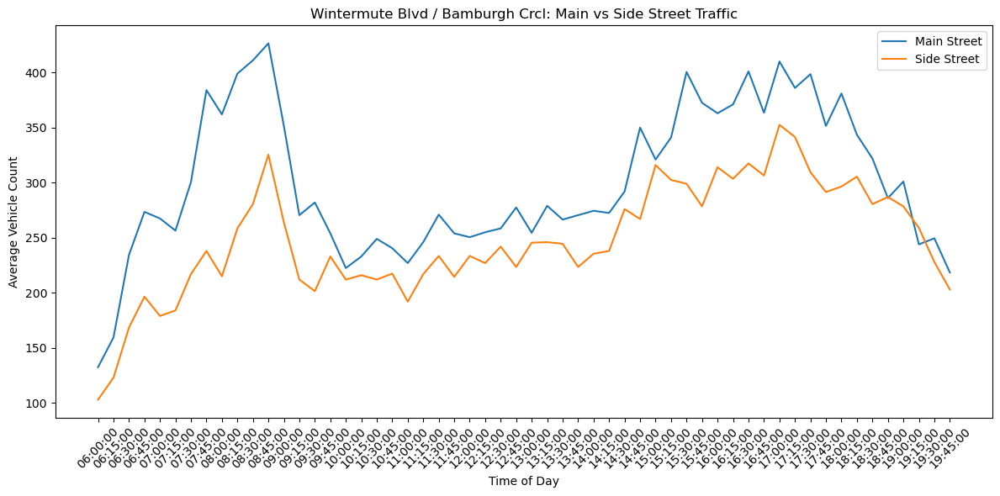

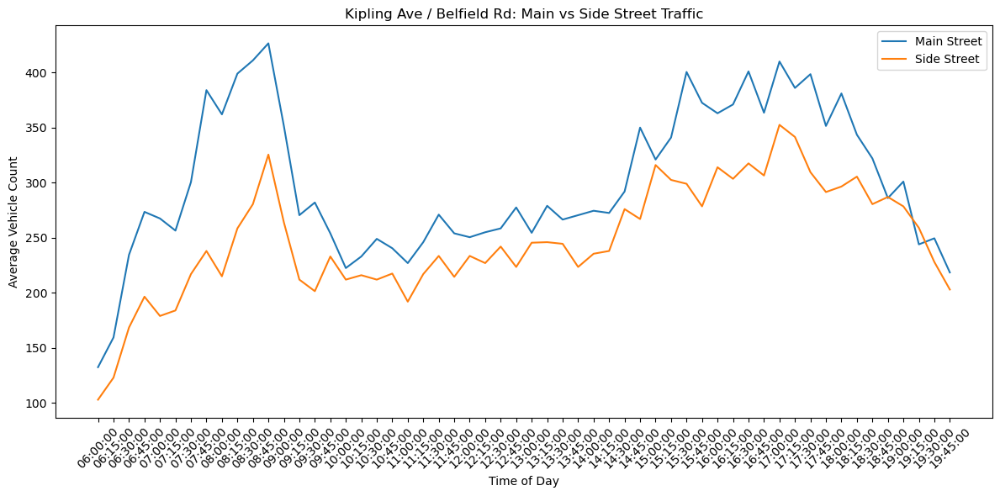

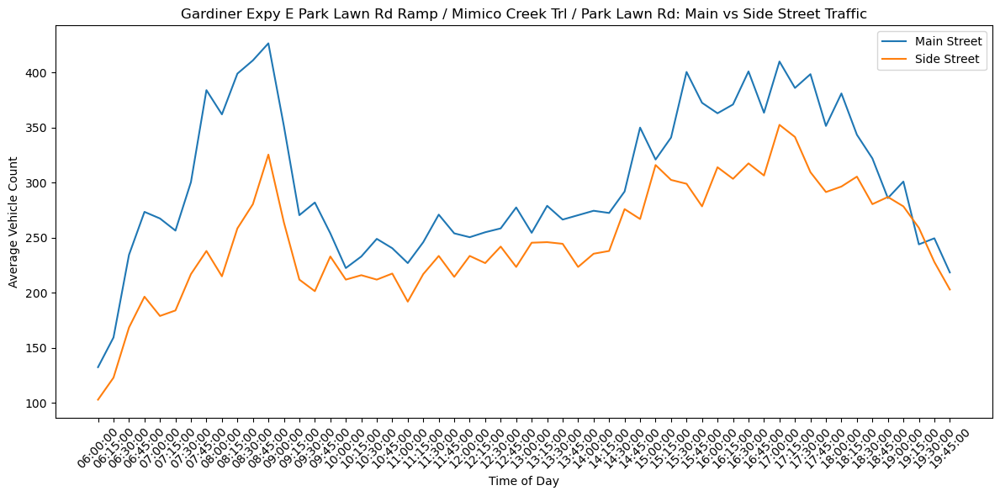

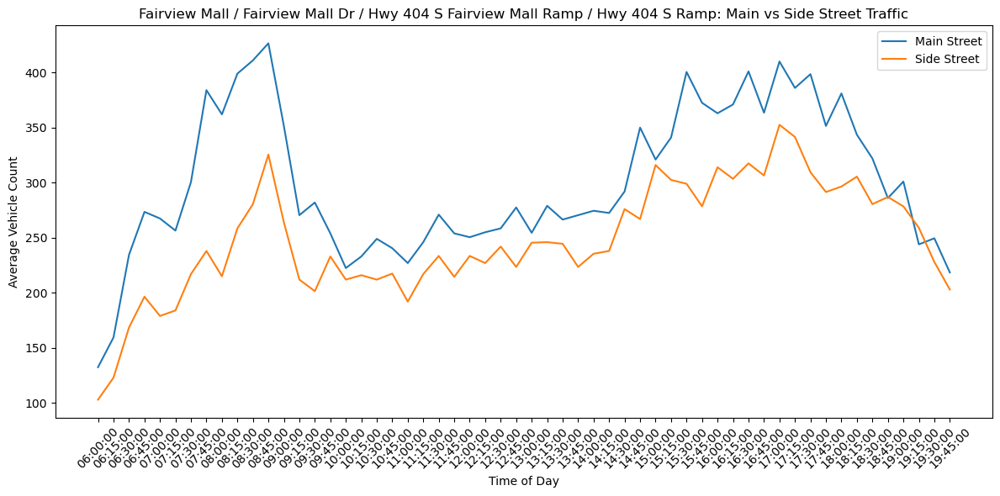

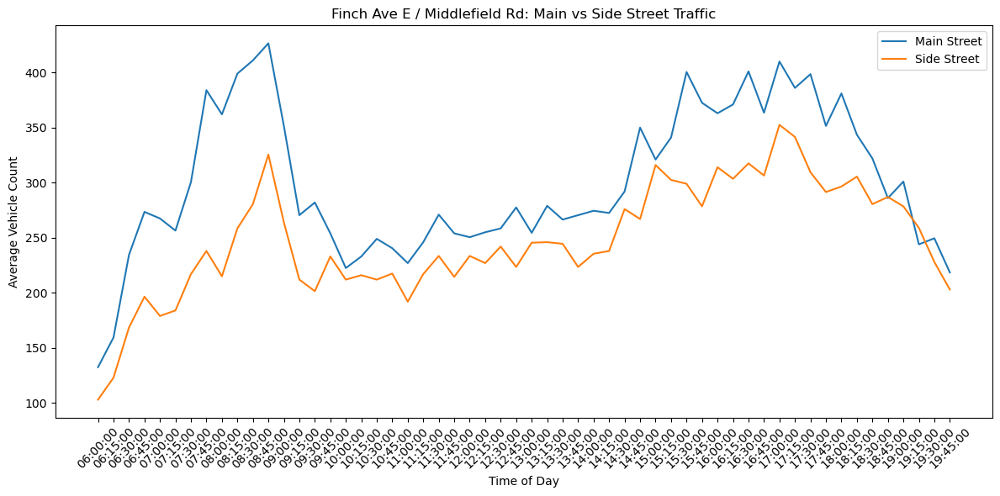

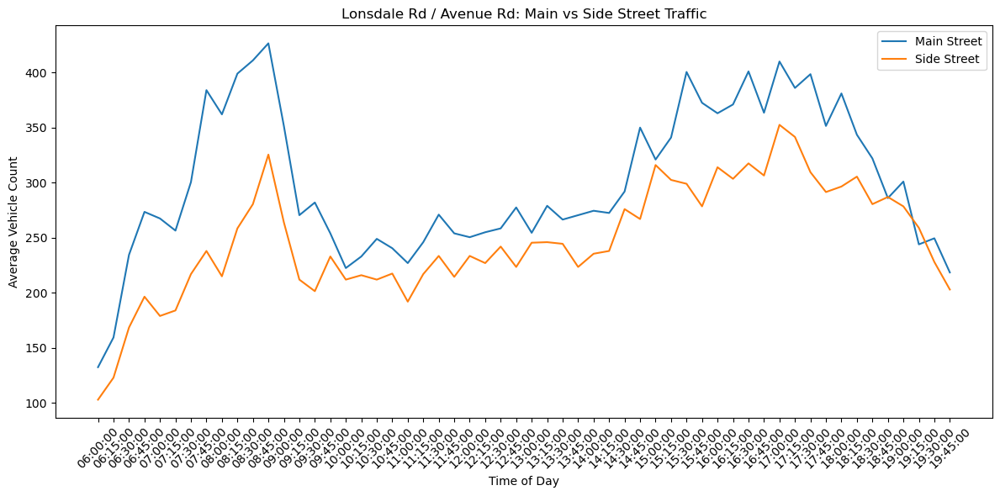

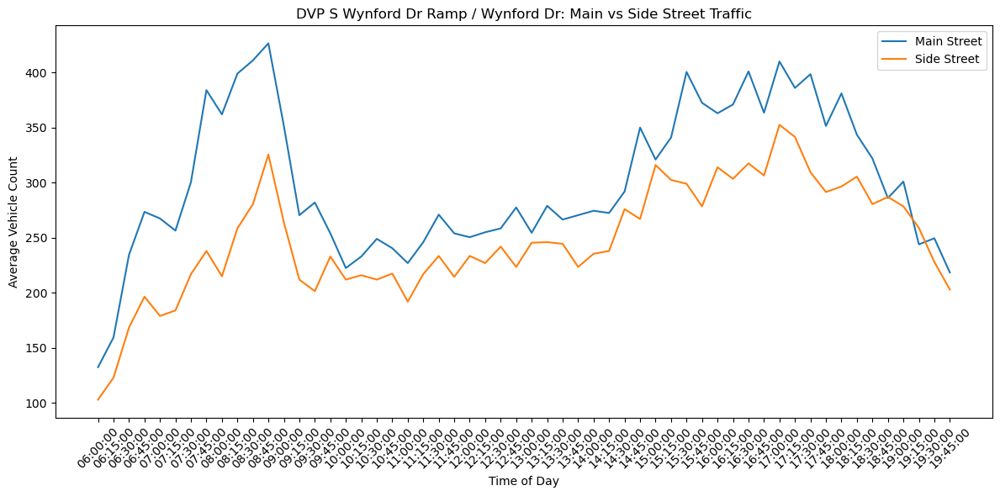

In [ ]:
for location in SA2_extreme["location_name"]:

    temp = ultimate_time_group[
        ultimate_time_group["location_name"] == location
    ]

    plt.figure(figsize=(12, 6))

    plt.plot(
        temp["start_time_day"],
        temp["main_vehicle"],
        label="Main Street"
    )

    plt.plot(
        temp["start_time_day"],
        temp["side_vehicle"],
        label="Side Street"
    )



    plt.xlabel("Time of Day")
    plt.ylabel("Average Vehicle Count")
    plt.title(f"{location}: Main vs Side Street Traffic")

    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
#now we look at the K for fixed streets and do the same things, K level filtering has be changed around to locate desriable results
FTmask = (signal_k["K"] >= 0) & (signal_k["CONTROL_MODE"] == "FT")
signal_k_FT_ranked = signal_k[FTmask].sort_values("K",ascending=False)
signal_k_FT_ranked

,location_name,MAIN_STREET,SIDE1_STREET,CONTROL_MODE,K,dominant,vehicle_ped_overlap,main_side_temporal_corr,K_pct,dominant_pct,vehicle_ped_overlap_pct,main_side_temporal_corr_pct
965,Bay St / St Mary St,BAY ST,ST MARY ST,FT,0.809217,1.000000,0.797156,0.824511,1.000000,0.750000,0.800000,0.650000
562,Winchester St / Parliament St,PARLIAMENT ST,WINCHESTER ST,FT,0.806286,1.000000,0.603446,0.208542,0.983333,0.750000,0.500000,0.066667
44,Bloor St W / Shaw St,BLOOR ST W,SHAW ST,FT,0.760394,1.000000,0.847706,0.715724,0.966667,0.750000,0.900000,0.516667
825,Wellesley St E / Homewood Ave,WELLESLEY ST E,HOMEWOOD AVE,FT,0.748514,1.000000,0.572366,0.551905,0.950000,0.750000,0.400000,0.216667
29,Lake Shore Blvd W / Long Branch Ave,LAKE SHORE BLVD W,LONG BRANCH AVE,FT,0.743761,1.000000,-0.160132,0.491570,0.933333,0.750000,0.016667,0.133333
413,Gerrard St E / Sackville St,GERRARD ST E,SACKVILLE ST,FT,0.730984,1.000000,0.597453,0.601675,0.916667,0.750000,0.466667,0.300000
967,Dundas St E / Mutual St,DUNDAS ST E,MUTUAL ST,FT,0.718543,1.000000,0.696848,0.567368,0.900000,0.750000,0.733333,0.266667
339,Dundas St E / Pape Ave,DUNDAS ST E,PAPE AVE,FT,0.718263,1.000000,0.406781,0.734121,0.883333,0.750000,0.216667,0.550000
101,King St E / Jarvis St,KING ST E,JARVIS ST,FT,0.685968,1.000000,-0.121940,-0.525133,0.866667,0.750000,0.033333,0.016667
136,Yonge St / Heath St W,YONGE ST,HEATH ST,FT,0.667540,1.000000,0.671630,0.687892,0.850000,0.750000,0.683333,0.450000


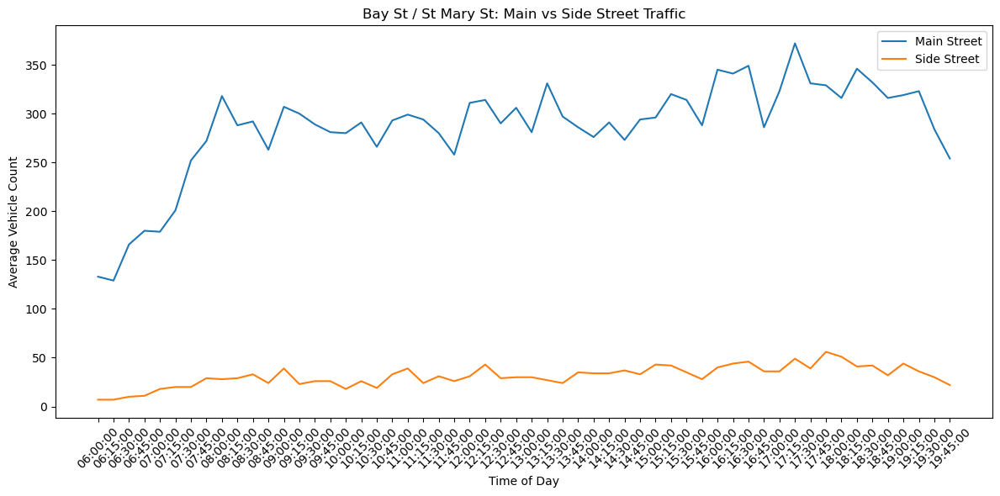

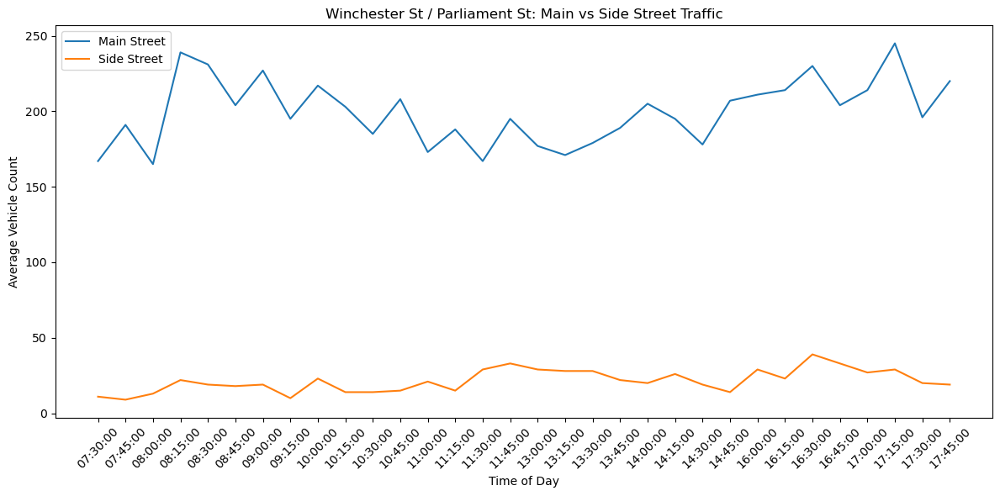

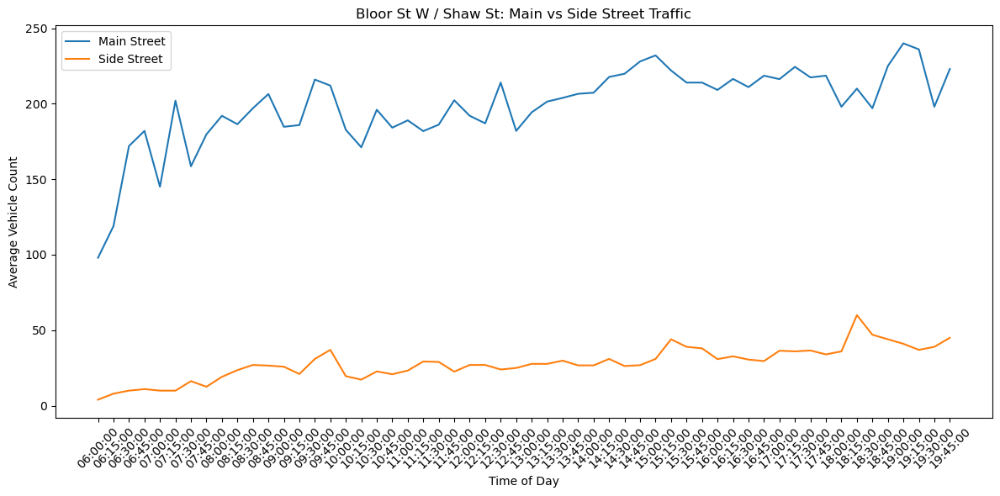

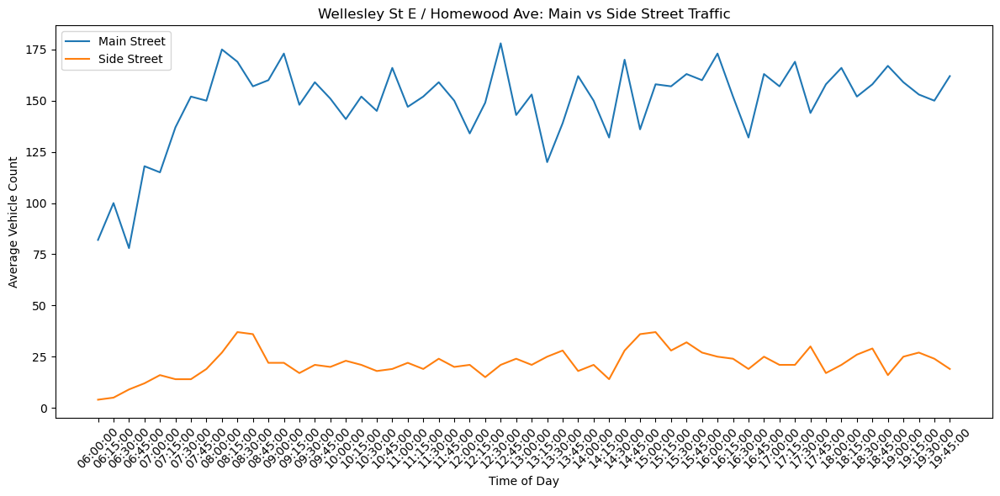

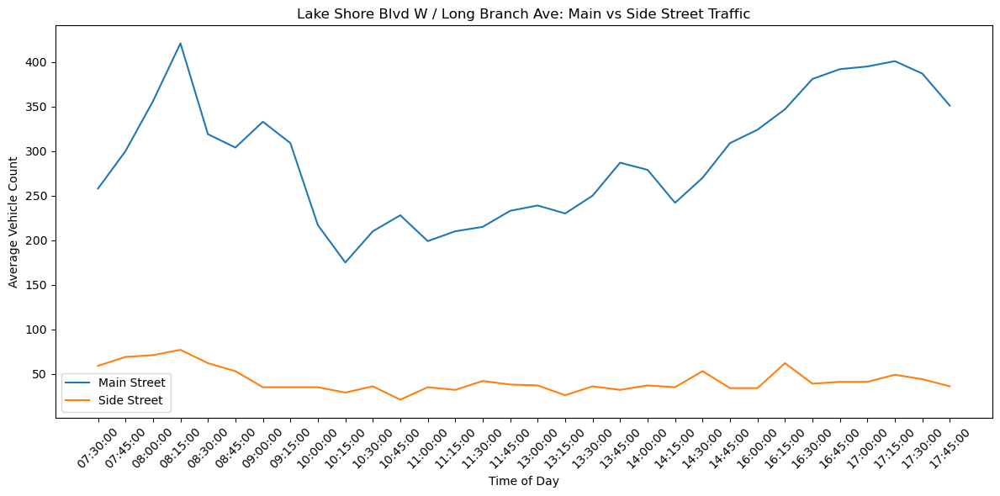

...

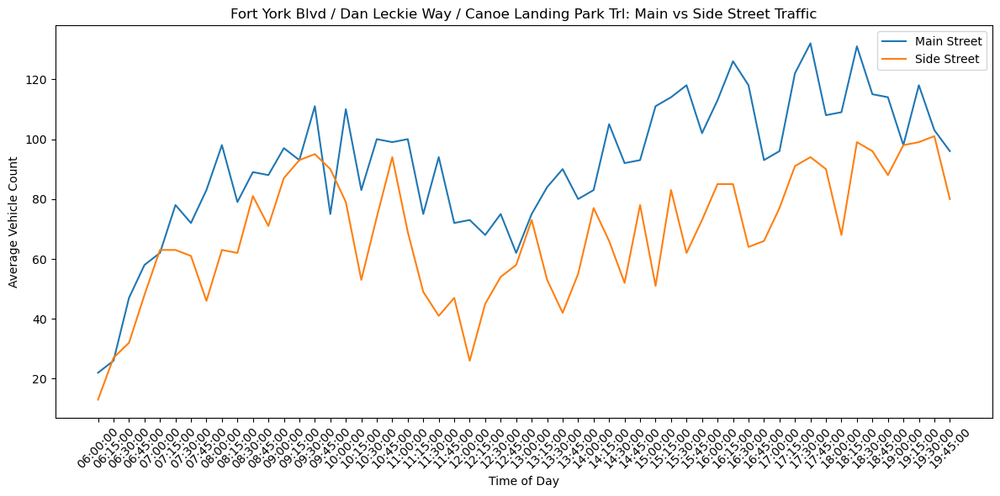

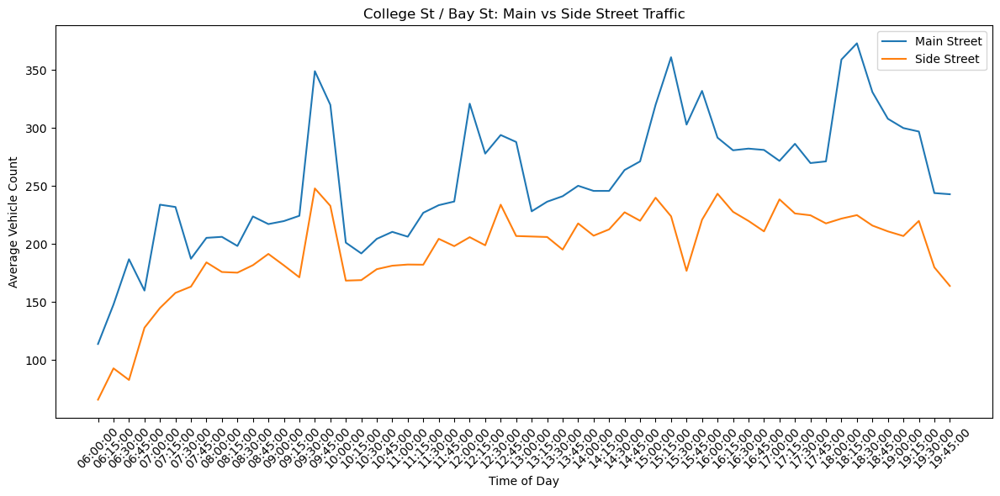

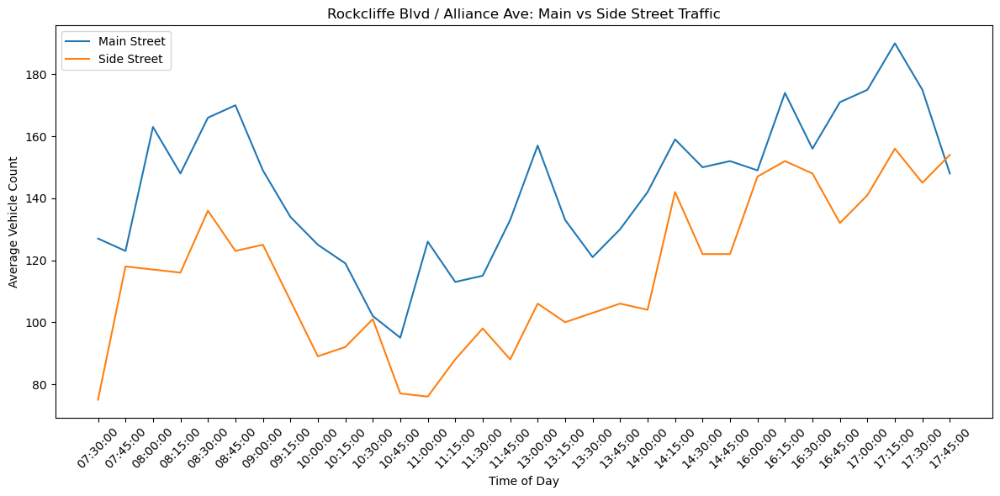

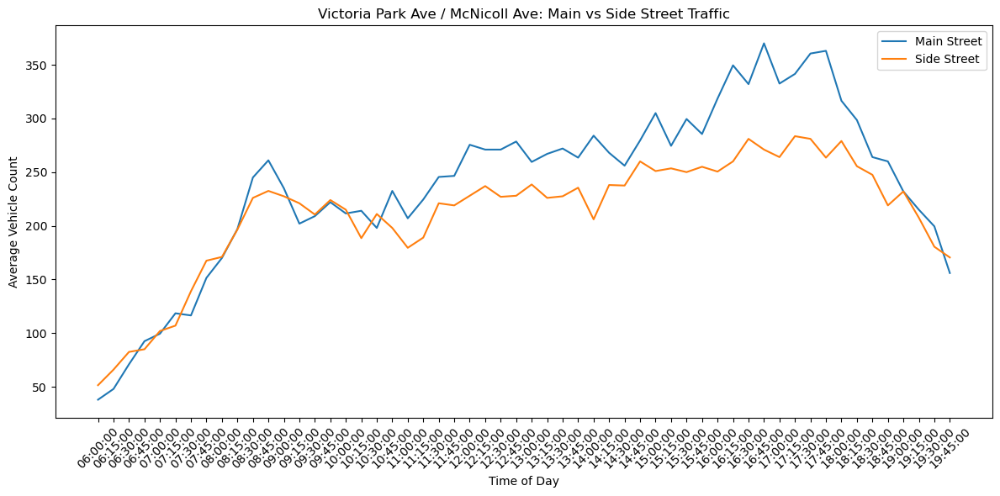

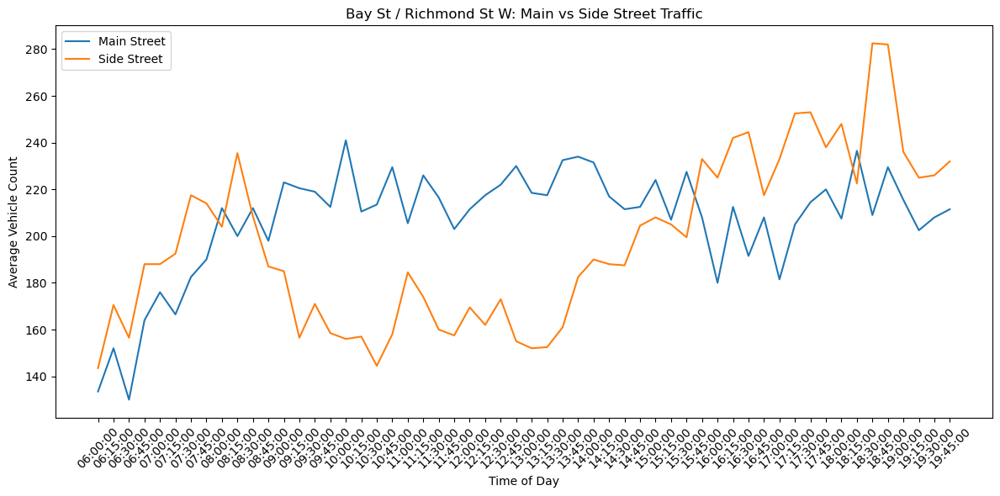

In [ ]:
#run this if you woud like to see intersection demands through day visually
for location in signal_k_FT_ranked["location_name"]:

    temp = ultimate_time_group[
        ultimate_time_group["location_name"] == location
    ]

    plt.figure(figsize=(12, 6))

    plt.plot(
        temp["start_time_day"],
        temp["main_vehicle"],
        label="Main Street"
    )

    plt.plot(
        temp["start_time_day"],
        temp["side_vehicle"],
        label="Side Street"
    )
    

    plt.xlabel("Time of Day")
    plt.ylabel("Average Vehicle Count")
    plt.title(f"{location}: Main vs Side Street Traffic")

    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [79]:
#SAP
SAPmask = (signal_k["K"] > 0.9) & (signal_k["CONTROL_MODE"] == "SAP")
signal_k_SAP_ranked = signal_k[SAPmask].sort_values("K",ascending=False)
signal_k_SAP_ranked

,location_name,MAIN_STREET,SIDE1_STREET,CONTROL_MODE,K,dominant,vehicle_ped_overlap,main_side_temporal_corr,K_pct,dominant_pct,vehicle_ped_overlap_pct,main_side_temporal_corr_pct
923,Pharmacy Ave / Gatineau Hydro Corridor Trl,PHARMACY AVE,RANNOCK ST,SAP,0.999960,1.0,-0.013475,0.140581,1.000000,0.547945,0.054795,0.095890
537,College St / Borden St,COLLEGE ST,BORDEN ST,SAP,0.992110,1.0,-0.045796,-0.083297,0.993151,0.547945,0.027397,0.041096
178,Oriole Pkwy / Gormley Ave,ORIOLE PKWY,GORMLEY AVE,SAP,0.986250,1.0,0.294467,0.266031,0.986301,0.547945,0.212329,0.143836
561,British Columbia Rd / Yukon Pl,BRITISH COLUMBIA RD,YUKON PL,SAP,0.978354,1.0,0.222845,-0.493030,0.979452,0.547945,0.164384,0.027397
936,Victoria Park Ave / Clydesdale Dr,VICTORIA PARK AVE,CLYDESDALE DR,SAP,0.956984,1.0,0.312266,0.544814,0.972603,0.547945,0.226027,0.390411
545,Spadina Ave / St Andrew St,SPADINA AVE,ST ANDREW ST,SAP,0.947872,1.0,0.798276,0.188481,0.965753,0.547945,0.897260,0.123288
907,St Clair Ave E / Ferndale Ave,ST CLAIR AVE E,FERNDALE AVE,SAP,0.947112,1.0,0.716059,0.628634,0.958904,0.547945,0.753425,0.493151
998,Yonge St / Gould St,YONGE ST,GOULD ST,SAP,0.942872,1.0,0.694536,0.654169,0.952055,0.547945,0.712329,0.520548
577,Jane St / Pritchard Ave (North),JANE ST,PRITCHARD AVE,SAP,0.939283,1.0,0.491746,0.589811,0.945205,0.547945,0.465753,0.458904
787,Bayview Ave / McKee Ave,BAYVIEW AVE,MCKEE AVE,SAP,0.926785,1.0,0.423787,0.660080,0.938356,0.547945,0.424658,0.547945


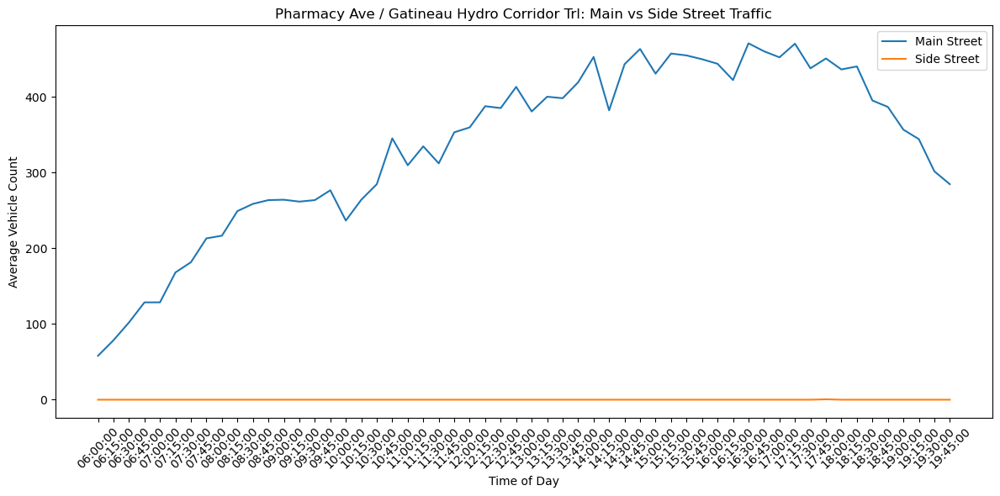

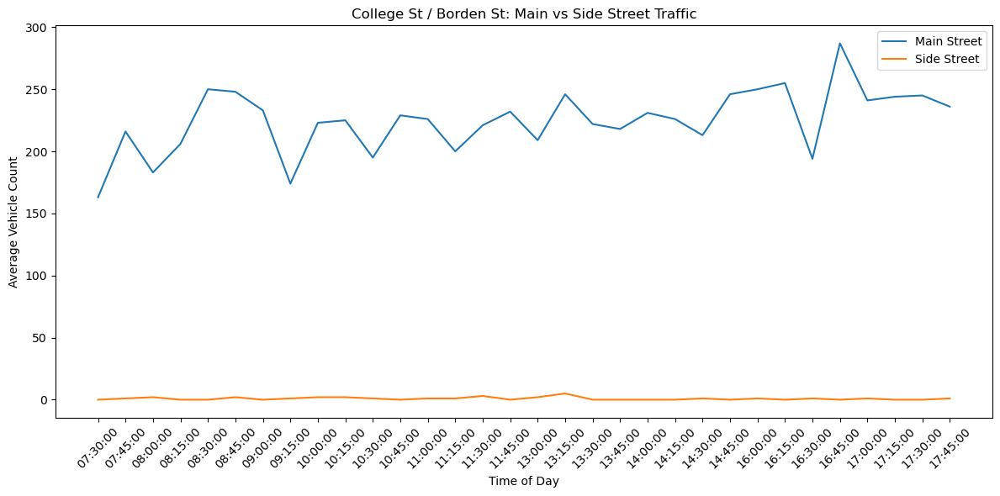

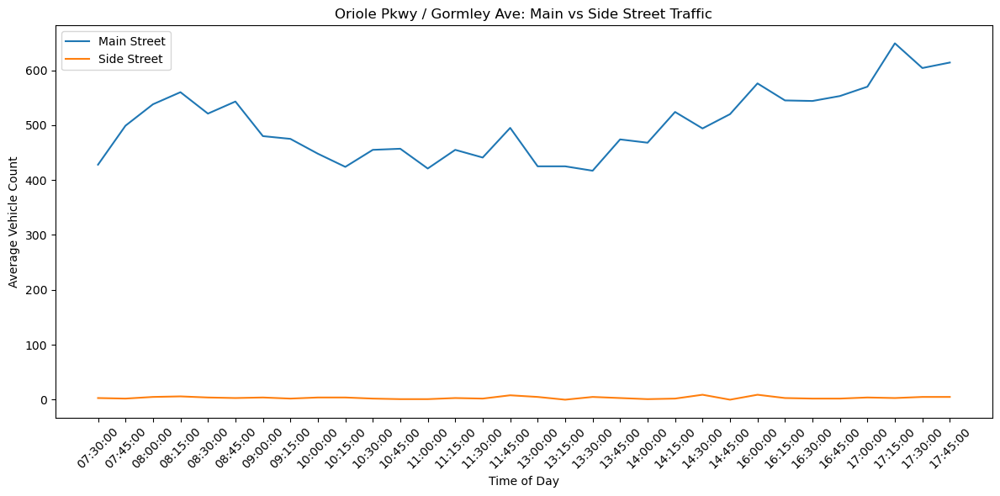

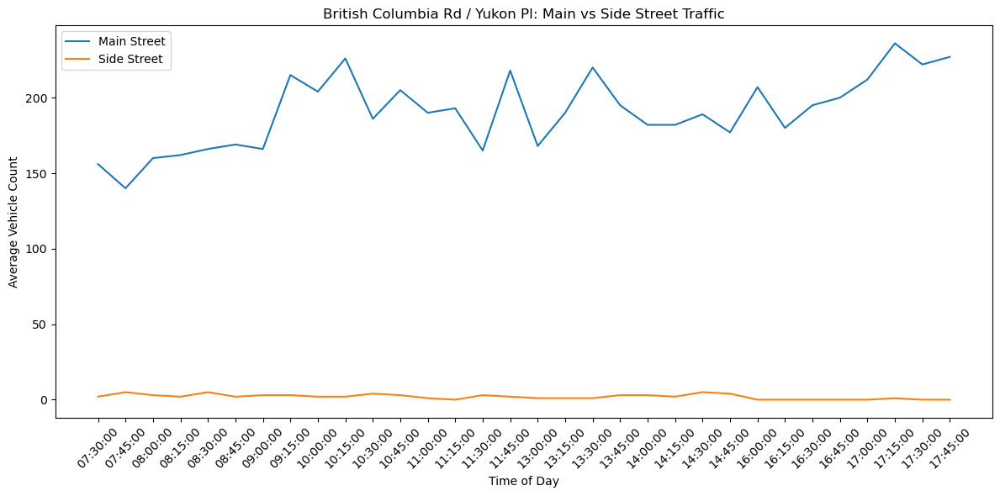

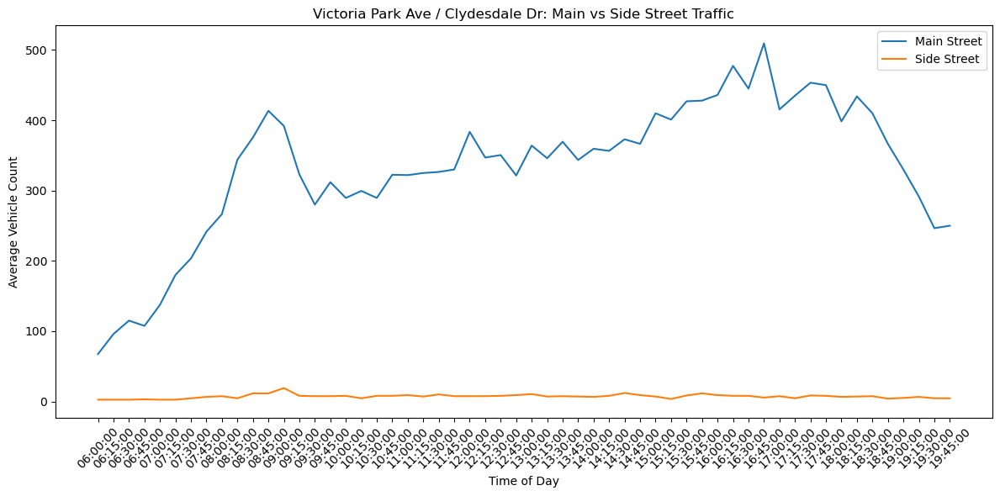

...

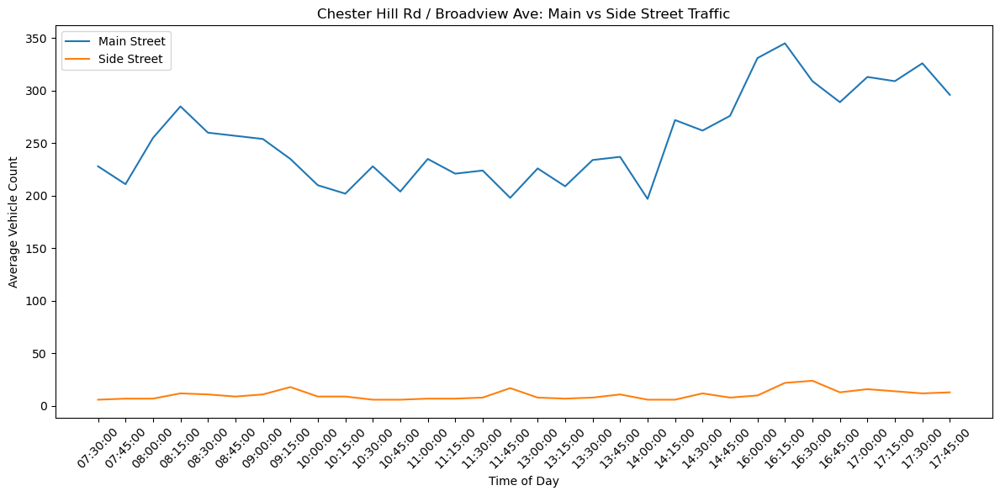

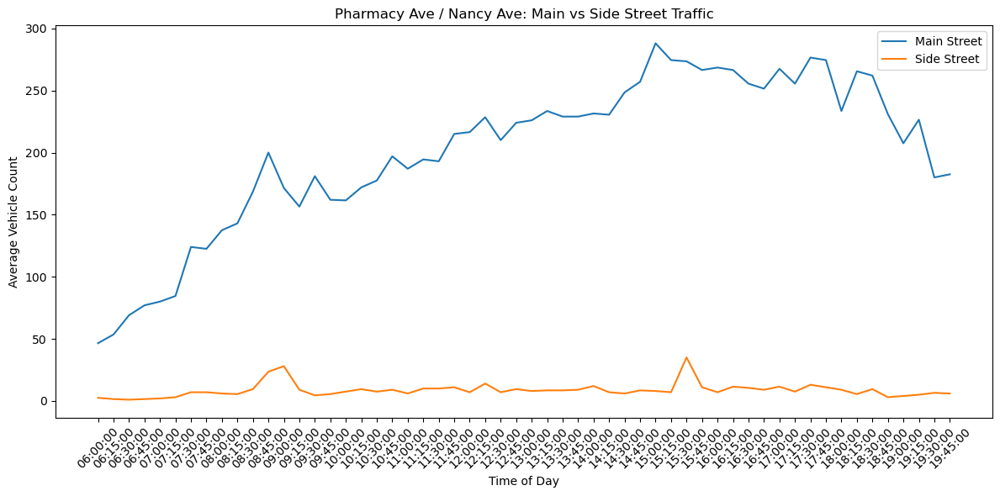

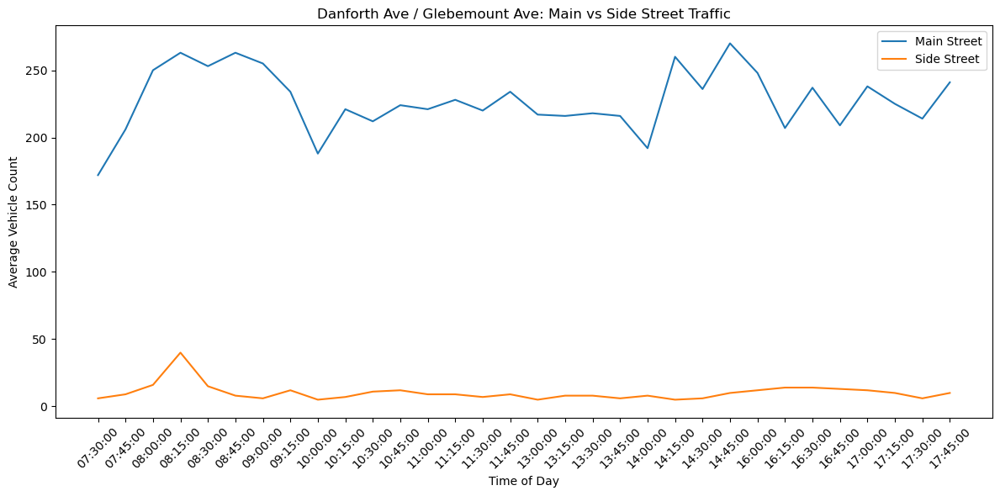

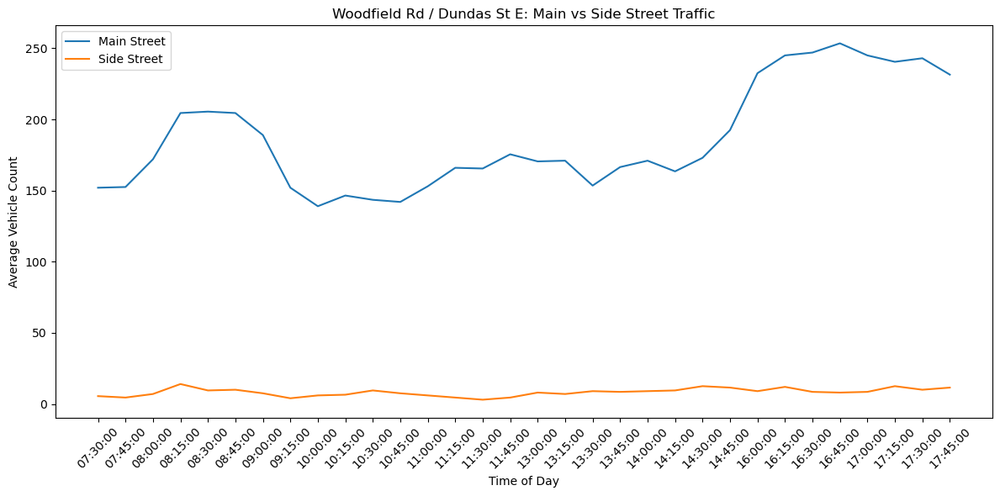

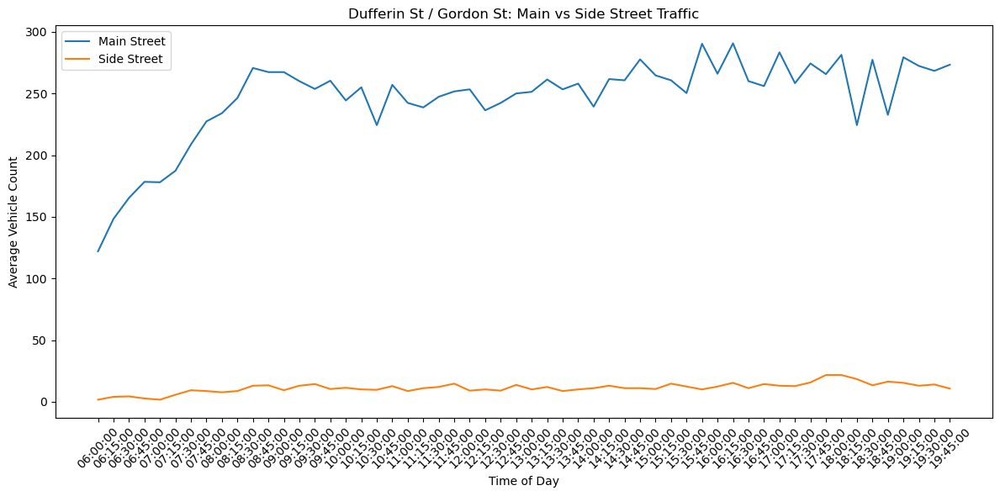

In [ ]:
#run this if you woud like to see intersection demands through day visually
for location in signal_k_SAP_ranked["location_name"]:

    temp = ultimate_time_group[
        ultimate_time_group["location_name"] == location
    ]

    plt.figure(figsize=(12, 6))

    plt.plot(
        temp["start_time_day"],
        temp["main_vehicle"],
        label="Main Street"
    )

    plt.plot(
        temp["start_time_day"],
        temp["side_vehicle"],
        label="Side Street"
    )
    

    plt.xlabel("Time of Day")
    plt.ylabel("Average Vehicle Count")
    plt.title(f"{location}: Main vs Side Street Traffic")

    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [81]:
#SA1
SA1mask =  signal_k["CONTROL_MODE"] == "SA1"
signal_k_SA1_ranked = signal_k[SA1mask].sort_values("K",ascending=False)
signal_k_SA1_ranked


,location_name,MAIN_STREET,SIDE1_STREET,CONTROL_MODE,K,dominant,vehicle_ped_overlap,main_side_temporal_corr,K_pct,dominant_pct,vehicle_ped_overlap_pct,main_side_temporal_corr_pct
990,Lawrence Ave E / Valparaiso Ave,LAWRENCE AVE E,VALPARAISO AVE,SA1,0.917567,1.000000,0.184311,0.614246,1.000000,0.763158,0.112782,0.285714
195,Eglinton Ave W / Hwy 27 / Hwy 401 / Hwy 427 Eglinton E Ramp,EGLINTON AVE W,27 401 427 EGLINTON E RAMP,SA1,0.778416,1.000000,-0.086555,0.770152,0.992481,0.763158,0.052632,0.428571
326,Yonge St / Marlborough Ave / Price St,YONGE ST,PRICE ST,SA1,0.754055,1.000000,0.681239,-0.052836,0.984962,0.763158,0.661654,0.037594
60,Sorauren Ave / Dundas St W,DUNDAS ST W,SORAUREN AVE,SA1,0.752912,1.000000,-0.086919,0.434917,0.977444,0.763158,0.045113,0.150376
140,Yonge St / Roxborough St W,YONGE ST,ROXBOROUGH ST W,SA1,0.746411,1.000000,0.757914,0.797738,0.969925,0.763158,0.721805,0.488722
210,Keele St / Canarctic Dr,KEELE ST,CANARCTIC DR,SA1,0.730325,1.000000,-0.056110,0.617634,0.962406,0.763158,0.060150,0.293233
422,Bloor St E / Ted Rogers Way,BLOOR ST E,TED ROGERS WAY,SA1,0.699340,1.000000,0.822845,0.612211,0.954887,0.763158,0.857143,0.278195
8,Davenport Rd / Belmont St / New St,DAVENPORT RD,BELMONT ST,SA1,0.672918,1.000000,0.774247,0.887065,0.947368,0.763158,0.751880,0.766917
91,St Clair Ave W / Winona Dr,ST CLAIR AVE W,WINONA DR,SA1,0.665519,1.000000,0.788645,0.814794,0.939850,0.763158,0.796992,0.548872
711,Davenport Rd / Bedford Rd,DAVENPORT RD,BEDFORD RD,SA1,0.646467,1.000000,0.891773,0.888897,0.932331,0.763158,0.977444,0.781955


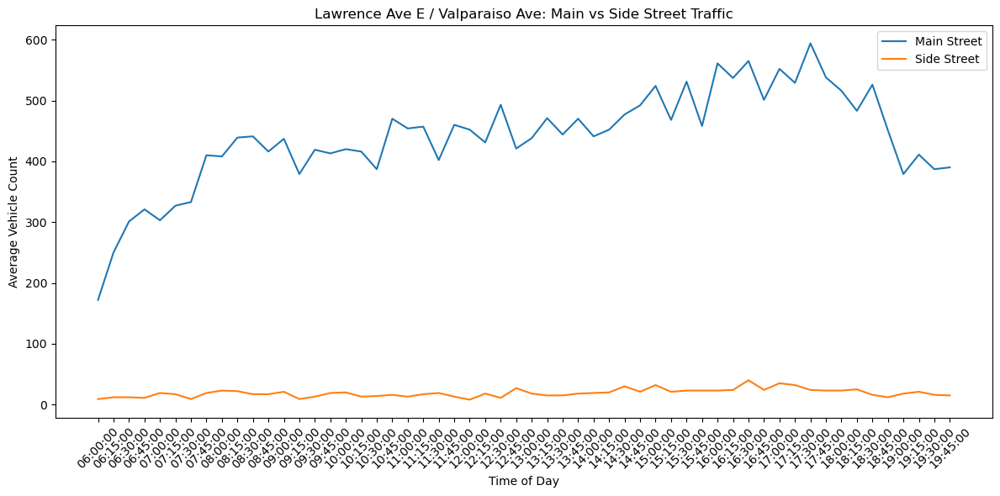

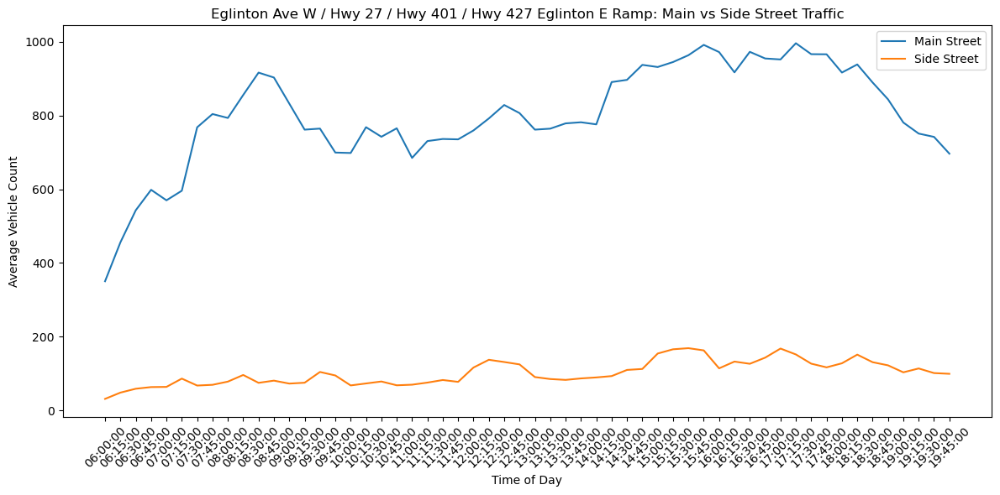

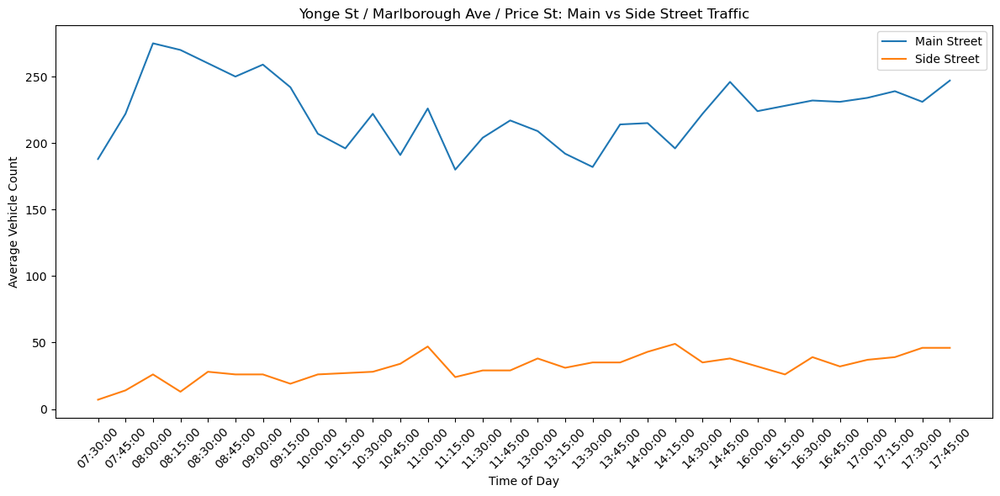

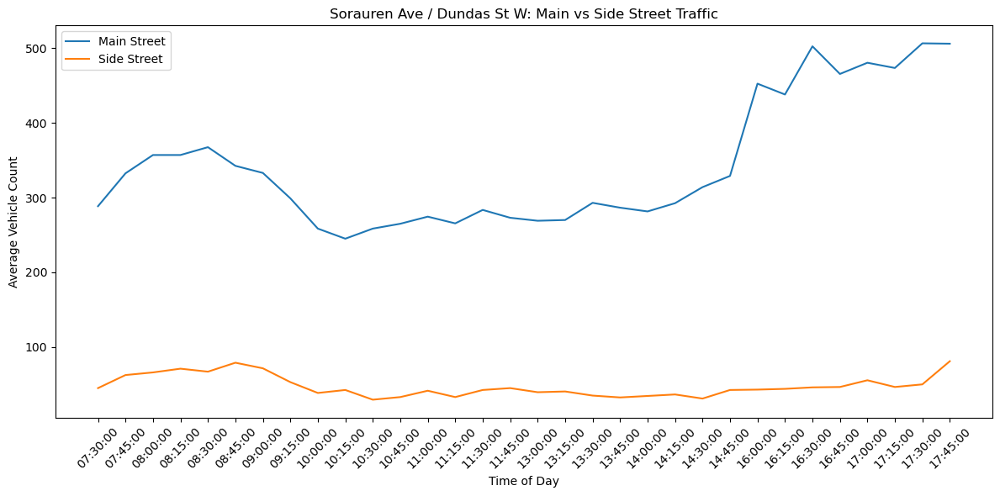

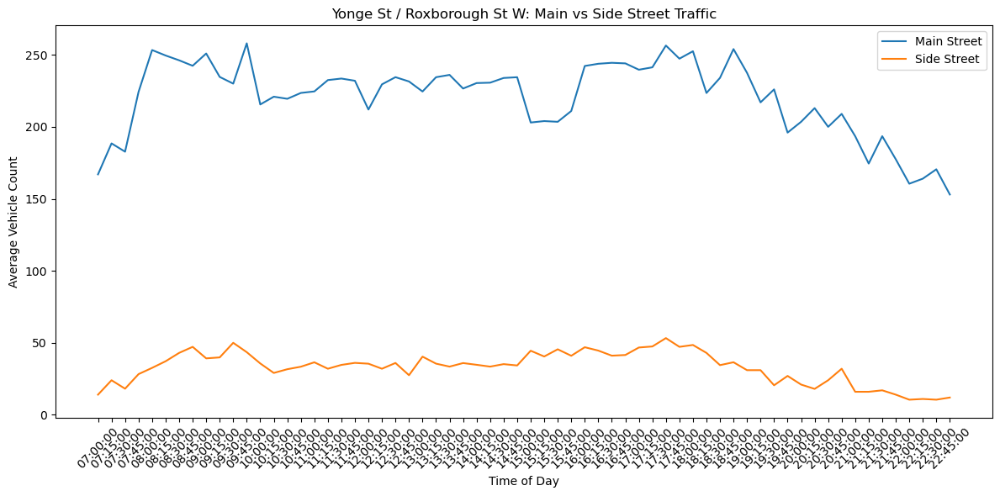

...

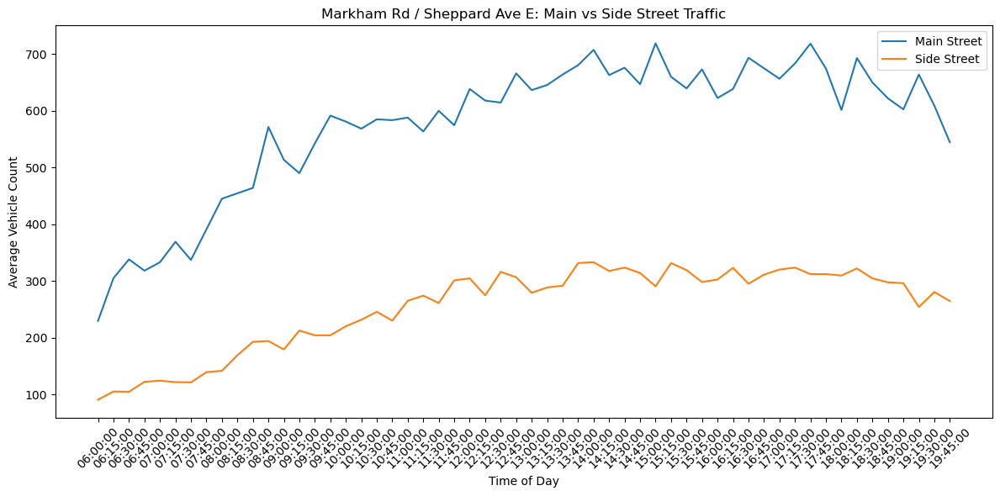

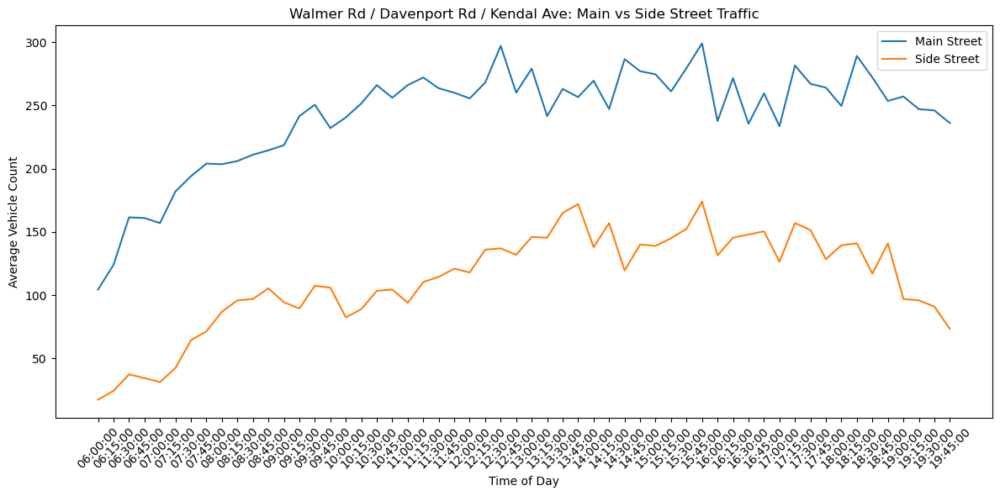

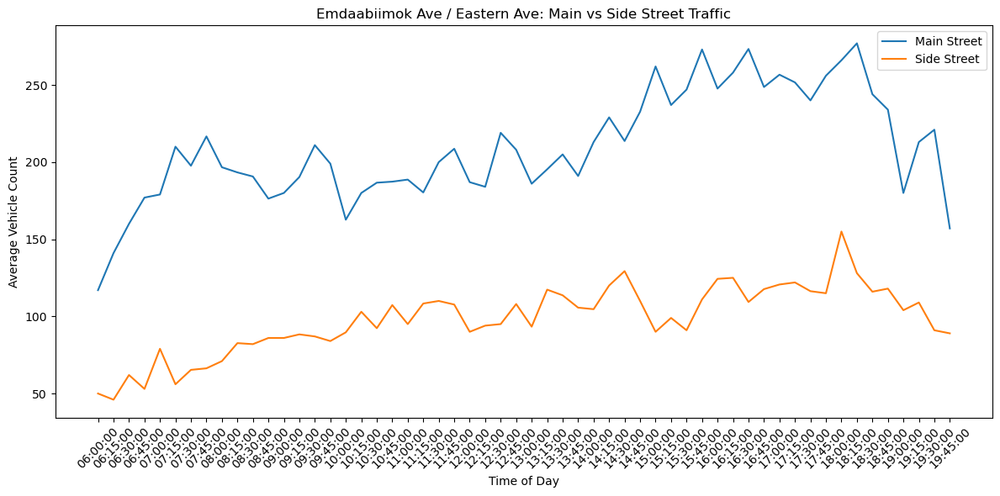

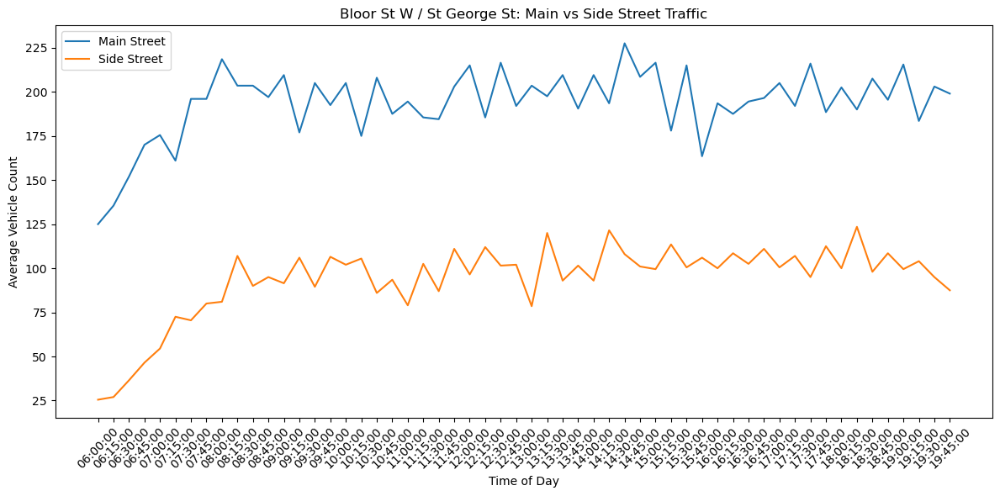

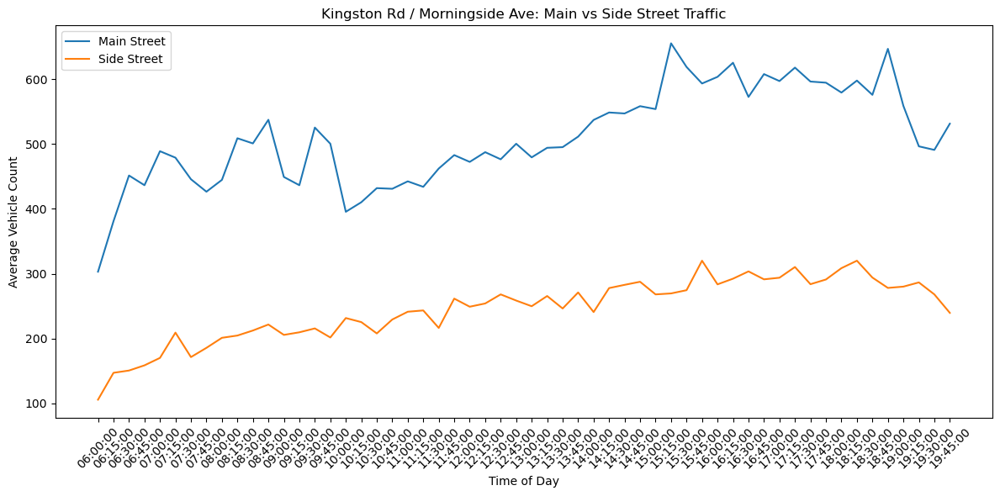

KeyboardInterrupt: 

In [87]:
#run this if you woud like to see intersection demands through day visually
for location in signal_k_SA1_ranked["location_name"]:

    temp = ultimate_time_group[
        ultimate_time_group["location_name"] == location
    ]

    plt.figure(figsize=(12, 6))

    plt.plot(
        temp["start_time_day"],
        temp["main_vehicle"],
        label="Main Street"
    )

    plt.plot(
        temp["start_time_day"],
        temp["side_vehicle"],
        label="Side Street"
    )
    

    plt.xlabel("Time of Day")
    plt.ylabel("Average Vehicle Count")
    plt.title(f"{location}: Main vs Side Street Traffic")

    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [82]:
recommendation_locations = [
    # SA2
    "Wintermute Blvd / Bamburgh Crcl",
    "Finch Ave E / Middlefield Rd",
    "Lonsdale Rd / Avenue Rd",
    "Gardiner Expy E Park Lawn Rd Ramp / Mimico Creek Trl / Park Lawn Rd",
    "Kipling Ave / Belfield Rd",
    "Fairview Mall / Fairview Mall Dr / Hwy 404 S Fairview Mall Ramp / Hwy 404 S Ramp",
    "DVP S Wynford Dr Ramp / Wynford Dr",

    # FT
    "King St E / Jarvis St",
    "Lake Shore Blvd W / Long Branch Ave",
    "Bloor St W / Shaw St",

    # SA1
    "Sorauren Ave / Dundas St W",
    "Eglinton Ave W / Hwy 27 / Hwy 401 / Hwy 427 Eglinton E Ramp",
    "Keele St / Canarctic Dr",
    "Yonge St / Roxborough St W",
    "Bloor St E / Ted Rogers Way",

    # SAP
    "Gardiner Expy Express W Sherway Gardens Ramp / Sherway Gardens Rd",
    "Danforth Ave / Glebemount Ave",
    "College St / Borden St",
    "Pharmacy Ave / Gatineau Hydro Corridor Trl"
]

recommendation_export = signal_k[
    signal_k["location_name"].isin(recommendation_locations)
].copy()

mode_order = ["SA2", "FT", "SA1", "SAP"]

recommendation_export["CONTROL_MODE"] = pd.Categorical(
    recommendation_export["CONTROL_MODE"],
    categories=mode_order,
    ordered=True
)

recommendation_export = recommendation_export.sort_values(
    ["CONTROL_MODE", "K"],
    ascending=[True, False]
)

recommendation_export.to_csv(
    "signal_recommendations.csv",
    index=False
)